In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from matplotlib import cm
import torch
import os

import sys
sys.path.insert(0, '../trainingdata')
from datasaver import *
sys.path.insert(0, '../testproblems/darcy')
from darcy_ms import *
sys.path.insert(0, '../ml')
from modelloader import loadmodelfromlabel
from NeuralOperator import NeuralOperator
from customlosses import *
from quadrature import *
from customlayers import discretize_functions
from basisfunctions import *

In [2]:
%load_ext autoreload
%autoreload 2

### Accuracy different NOs versus $\lambda$

In [46]:
from NeuralOperator import NeuralOperator

logdir = '../../../nnlogs'
device = 'cuda:3'

sublogdir = 'Fourier'

#NN = loadmodelfromlabel(model=NeuralOperator, label='NN', logdir=logdir, sublogdir=sublogdir, device=device)
# dataNGO = loadmodelfromlabel(model=NeuralOperator, label='dataNGO', logdir=logdir, sublogdir=sublogdir, device=device)
# dataNGO.hparams['Assembly_mode'] = 'series'
# datafreeNGO = loadmodelfromlabel(model=NeuralOperator, label='datafreeNGO', logdir=logdir, sublogdir=sublogdir, device=device)
# datafreeNGO.hparams['Assembly_mode'] = 'series'
# modelNGO = loadmodelfromlabel(model=NeuralOperator, label='modelNGO', logdir=logdir, sublogdir=sublogdir, device=device)
# modelNGO.hparams['Assembly_mode'] = 'series'
projection = loadmodelfromlabel(model=NeuralOperator, label='modelNGO_L1.2', logdir=logdir, sublogdir=sublogdir, device=device)
projection.hparams['modeltype'] = 'projection'
projection.hparams['dtype'] = torch.float64
projection.hparams['precision'] = 64
# FEM = loadmodelfromlabel(model=NeuralOperator, label='modelNGO', logdir=logdir, sublogdir=sublogdir, device=device)
# FEM.hparams['modeltype'] = 'FEM'
# FEM.hparams['dtype'] = torch.float64
# FEM.hparams['precision'] = 64
# FEM.hparams['Neumannseries'] = False
# FEM.hparams['Assembly_mode'] = 'series'


modeldict = {'Projection': projection}#,
             #'NN': NN,
             #'FEM': FEM}
            #'Data NGO': dataNGO,
            #'Data-free NGO': datafreeNGO,
            #'Model NGO': modelNGO}

/data/storage8/prins/prins/phd/gitlab/ngo-pde-gk/analysisnotebooks/../testproblems/darcy/NeuralOperator.py:118: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  A_0 = torch.tensor(A_0, dtype=self.hparams['dtype'], device=self.used_device)


In [47]:
# from NeuralOperator import NeuralOperator

# logdir = '../../../nnlogs'
# device = 'cuda:3'

# sublogdir = 'project_theta'

# dataNGO_theta = loadmodelfromlabel(model=NeuralOperator, label='dataNGO_theta', logdir=logdir, sublogdir=sublogdir, device=device)
# dataNGO_projectedtheta = loadmodelfromlabel(model=NeuralOperator, label='dataNGO_projectedtheta', logdir=logdir, sublogdir=sublogdir, device=device)
# modelNGO_theta = loadmodelfromlabel(model=NeuralOperator, label='modelNGO_theta', logdir=logdir, sublogdir=sublogdir, device=device)
# modelNGO_projectedtheta = loadmodelfromlabel(model=NeuralOperator, label='modelNGO_projectedtheta', logdir=logdir, sublogdir=sublogdir, device=device)
# projection = loadmodelfromlabel(model=NeuralOperator, label='modelNGO_theta', logdir=logdir, sublogdir=sublogdir, device=device)
# projection.hparams['modeltype'] = 'projection'
# projection.hparams['dtype'] = torch.float64
# projection.hparams['precision'] = 64
# FEM = loadmodelfromlabel(model=NeuralOperator, label='modelNGO_theta', logdir=logdir, sublogdir=sublogdir, device=device)
# FEM.hparams['modeltype'] = 'FEM'
# FEM.hparams['dtype'] = torch.float64
# FEM.hparams['precision'] = 64
# FEM.hparams['Neumannseries'] = False
# FEM_projectedtheta = loadmodelfromlabel(model=NeuralOperator, label='modelNGO_theta', logdir=logdir, sublogdir=sublogdir, device=device)
# FEM_projectedtheta.hparams['modeltype'] = 'FEM'
# FEM_projectedtheta.hparams['dtype'] = torch.float64
# FEM_projectedtheta.hparams['precision'] = 64
# FEM_projectedtheta.hparams['Neumannseries'] = False
# FEM_projectedtheta.hparams['project_inputs'] = True

# modeldict = {'Projection': projection,
#              'FEM': FEM,
#              'FEM (projected theta)': FEM_projectedtheta,
#             'Data NGO': dataNGO_theta,
#             'Data NGO (projected theta)': dataNGO_projectedtheta,
#             'model NGO': modelNGO_theta,
#             'model NGO (projected theta)': modelNGO_projectedtheta}

0.05
0
0
0
0
0
0
0
0
0
0.1
0
0
0
0
0
0
0
0
0


/data/storage8/prins/prins/phd/gitlab/ngo-pde-gk/analysisnotebooks/../testproblems/darcy/NeuralOperator.py:287: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  theta = torch.tensor(theta, dtype=self.hparams['dtype'], device=self.used_device)
/data/storage8/prins/prins/phd/gitlab/ngo-pde-gk/analysisnotebooks/../testproblems/darcy/NeuralOperator.py:288: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f = torch.tensor(f, dtype=self.hparams['dtype'], device=self.used_device)
/data/storage8/prins/prins/phd/gitlab/ngo-pde-gk/analysisnotebooks/../testproblems/darcy/NeuralOperator.py:289: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTe

0.2
0
0
0
0
0
0
0
0
0
0.3
0
0
0
0
0
0
0
0
0
0.4
0
0
0
0
0
0
0
0
0
0.5
0
0
0
0
0
0
0
0
0
0.6
0
0
0
0
0
0
0
0
0
0.7
0
0
0
0
0
0
0
0
0
0.8
0
0
0
0
0
0
0
0
0
0.9
0
0
0
0
0
0
0
0
0
1.0
0
0
0
0
0
0
0
0
0


/tmp/ipykernel_3386375/1745157586.py:72: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string ".-" (-> linestyle='-'). The keyword argument will take precedence.
  plots.append(ax.errorbar(l, L2_scaled_avg[m], yerr=yerr[m], fmt=".-", capsize=6, ms=15, label=str(model), color=colors[m], linestyle=linestyles[m]))


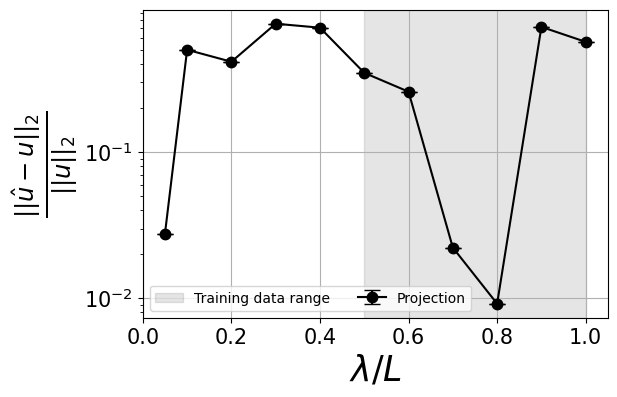

In [48]:
N_samples = 1

alpha = 0.05
q_low = alpha/2
q_high = 1 - q_low


l = np.array([0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

# l = np.array([1])

# l = np.array([0.4, 0.3, 0.2, 0.1, 0.05])
L2_scaled_avg = np.zeros((len(modeldict),len(l)))
yerr = np.zeros((len(modeldict),2,len(l)))

size_title = 20
size_ticklabels = 15
size_axeslabels = 25

# quadrature = GaussLegendreQuadrature2D(n_elements=1, Q=100)
quadrature = UniformQuadrature2D(Q=100)
x = torch.tensor(quadrature.xi_Omega, device=device)
w = torch.tensor(quadrature.w_Omega, device=device)

linestyles=['-','-','--','--', '--','--','--','--','--','--']
colors = ['black','grey','C0','C1','C2','C3','C4','C0','C1','C2','C3','C4']
# markers = ['o','^','o','^','o','^','o']
    
for i in range(len(l)):
    print(l[i])
    dataset = ManufacturedSolutionsSetDarcy(N_samples=N_samples, variables=['x','x'], l_min=[l[i],l[i]], l_max=[l[i],l[i]], device=device)
    theta = dataset.theta
    f = dataset.f
    etat = dataset.etat
    etab = dataset.etab
    gl = dataset.gl
    gr = dataset.gr
    u = dataset.u
    m=0
    for model in modeldict:
        u_exact = discretize_functions(u, x, dtype=modeldict[str(model)].hparams['dtype'], device=device)
        u_hat = modeldict[str(model)].simforward(theta, f, etab, etat, gl, gr, x, u).detach()
        L2_scaled_array = weightedrelativeL2_set(w, u_hat, u_exact).detach().cpu().numpy()
        L2_scaled_avg[m,i] = np.average(L2_scaled_array)
        q_l = np.quantile(L2_scaled_array, q_low)
        q_h = np.quantile(L2_scaled_array, q_high)
        yerr[m,:,i] = np.array([L2_scaled_avg[m,i] - q_l, -L2_scaled_avg[m,i] + q_h])
        m+=1

L2_scaled_avg[L2_scaled_avg<0] = np.nan
yerr[yerr<0] = np.nan

fig, ax = plt.subplots(1,1, figsize=(6, 4))
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.4)

plots = []
plots.append(ax.axvspan(0.5,1, color='black', alpha=0.1, label='Training data range'))
m=0
ax.tick_params(axis='both', labelsize=size_ticklabels)
ax.set_xlabel(r'$\lambda/L$', fontsize=size_axeslabels)
ax.set_ylabel(r'$\frac{||\hat{u}-u||_2}{||u||_2}$', fontsize=size_axeslabels)
ax.set_yscale('log')
ax.set_xlim(0, 1.05)
# ax.set_ylim(1e-7, 1e2)
# ax.set_yticks([1e-6, 1e-4, 1e-2, 1e0, 1e2])
# ax.set_yticks([1e-6, 1e-4, 1e-2, 1e0, 1e2])
# ax.set_xscale('log')
ax.grid()
# ax.set_title('FNO', fontsize=size_title)
for model in modeldict:
    # ax.plot(l, L2_scaled_avg[m], color=colors[m], label=str(model), linestyle=linestyles[m], marker='o')
    plots.append(ax.errorbar(l, L2_scaled_avg[m], yerr=yerr[m], fmt=".-", capsize=6, ms=15, label=str(model), color=colors[m], linestyle=linestyles[m]))
        # plt.savefig(str(m)+".svg", bbox_inches='tight')#, transparent=True)
    m+=1
    # plt.legend(fontsize=10, loc='upper right')
    # plt.savefig(str(m)+".svg", bbox_inches='tight')#, transparent=True)
plt.legend(fontsize=10, ncols=2)
# legend1 = ax.legend(handles=[plots[0],plots[1],plots[2]],fontsize=10, ncols=1, loc='lower left')
# plt.gca().add_artist(legend1)
# plt.legend(handles=[plots[3],plots[4],plots[5]],fontsize=10, ncols=1, loc='upper right')
plt.savefig("poly.svg", bbox_inches='tight')#, transparent=True)

plt.show()

In [ ]:
from NeuralOperator import NeuralOperator

logdir = '../../../nnlogs'
device = 'cuda:3'

sublogdir = 'N_w_models/modelNGO'
NGO = loadmodelfromlabel(model=NeuralOperator, label='30000', logdir=logdir, sublogdir=sublogdir, device=device)
FEM = loadmodelfromlabel(model=NeuralOperator, label='30000', logdir=logdir, sublogdir=sublogdir, device=device)
FEM.hparams['modeltype'] = 'FEM'
FEM.hparams['dtype'] = torch.float64
FEM.hparams['precision'] = 64
FEM.hparams['Neumannseries'] = False
projection = loadmodelfromlabel(model=NeuralOperator, label='30000', logdir=logdir, sublogdir=sublogdir, device=device)
projection.hparams['modeltype'] = 'projection'
projection.hparams['dtype'] = torch.float64
projection.hparams['precision'] = 64


modeldict = {'Projection': projection,
             'FEM': FEM,
            'Model NGO': NGO}

0.0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


/data/storage8/prins/prins/phd/gitlab/ngo-pde-gk/analysisnotebooks/../testproblems/darcy/NeuralOperator.py:251: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  theta = torch.tensor(theta, dtype=self.hparams['dtype'], device=self.used_device)
/data/storage8/prins/prins/phd/gitlab/ngo-pde-gk/analysisnotebooks/../testproblems/darcy/NeuralOperator.py:252: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f = torch.tensor(f, dtype=self.hparams['dtype'], device=self.used_device)
/data/storage8/prins/prins/phd/gitlab/ngo-pde-gk/analysisnotebooks/../testproblems/darcy/NeuralOperator.py:253: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTe

0
0
0
0
0
0
0
0
0
0
0


/data/storage8/prins/prins/phd/gitlab/ngo-pde-gk/analysisnotebooks/../testproblems/darcy/NeuralOperator.py:265: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  theta_bar = torch.tensor(torch.sum(self.w_Omega[None,:]*theta, axis=-1), dtype=self.hparams['dtype'], device=self.used_device)


0
0
0
0
0
0
0
0
0
0
0.1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0.2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0.3
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0.4
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0.5
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0.6
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0.7
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0.8
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0.9
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1.0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


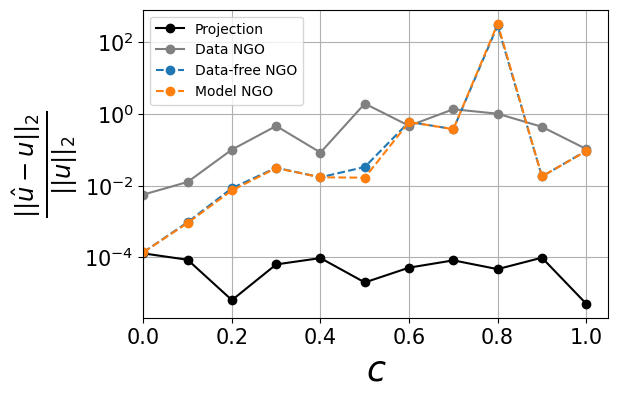

In [58]:
N_samples = 1

alpha = 0.05
q_low = alpha/2
q_high = 1 - q_low


c_thetas = np.array([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1])

# l = np.array([1])

# l = np.array([0.4, 0.3, 0.2, 0.1, 0.05])
L2_scaled_avg = np.zeros((len(modeldict),len(c_thetas)))
yerr = np.zeros((len(modeldict),2,len(c_thetas)))

size_title = 20
size_ticklabels = 15
size_axeslabels = 25

# quadrature = GaussLegendreQuadrature2D(n_elements=1, Q=100)
quadrature = UniformQuadrature2D(Q=108)
x = torch.tensor(quadrature.xi_Omega, device=device)
w = quadrature.w_Omega

linestyles=['-','-','--','--','--','--', '--','--','--','--','--','--']
colors = ['black','grey','C0','C1','C2','C3','C4','C0','C1','C2','C3','C4']
# markers = ['o','^','o','^','o','^','o']
    
for i in range(len(c_thetas)):
    print(c_thetas[i])
    dataset = ManufacturedSolutionsSetDarcy_ctheta(N_samples=N_samples, variables=['x','x'], l_min=[0.5,0.5], l_max=[1,1], c_theta = c_thetas[i], device=device)
    theta = dataset.theta
    f = dataset.f
    etat = dataset.etat
    etab = dataset.etab
    gl = dataset.gl
    gr = dataset.gr
    u = dataset.u
    m=0
    for model in modeldict:
        u_exact = discretize_functions(u, x, dtype=modeldict[str(model)].hparams['dtype'], device=device).cpu().numpy()
        u_hat = modeldict[str(model)].simforward(theta, f, etab, etat, gl, gr, x, u).detach().cpu().numpy()
        L22_diff = np.sum(w[None,:]*(u_hat - u_exact)**2, axis=-1)
        L2_diff = L22_diff**(1/2)
        L22_norm = np.sum(w[None,:]*(u_exact)**2, axis=-1)
        L2_norm = L22_norm**(1/2)
        L2_scaled_array = L2_diff/np.maximum(L2_norm, 1e-7*np.ones_like(L2_norm))
        L2_scaled_avg[m,i] = np.average(L2_scaled_array)
        q_l = np.quantile(L2_scaled_array, q_low)
        q_h = np.quantile(L2_scaled_array, q_high)
        yerr[m,:,i] = np.array([L2_scaled_avg[m,i] - q_l, -L2_scaled_avg[m,i] + q_h])
        m+=1
        
fig, ax = plt.subplots(1,1, figsize=(6, 4))
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.4)

plots = []
#plots.append(ax.axvspan(0.5,1, color='black', alpha=0.1, label='Training data range'))
m=0
ax.tick_params(axis='both', labelsize=size_ticklabels)
ax.set_xlabel(r'$c$', fontsize=size_axeslabels)
ax.set_ylabel(r'$\frac{||\hat{u}-u||_2}{||u||_2}$', fontsize=size_axeslabels)
ax.set_yscale('log')
ax.set_xlim(0, 1.05)
# ax.set_ylim(1e-7, 1e2)
# ax.set_yticks([1e-6, 1e-4, 1e-2, 1e0, 1e2, 1e4])
# ax.set_yticks([1e-4, 1e-3, 1e-2, 1e-1, 1e0, 1e1])
# ax.set_xscale('log')
ax.grid()
# ax.set_title(sublogdir, fontsize=size_title)
for model in modeldict:
    # ax.plot(l, L2_scaled_avg[m], color=colors[m], label=str(model), linestyle=linestyles[m], marker='o')
    plots.append(ax.plot(c_thetas, L2_scaled_avg[m], label=str(model), color=colors[m], linestyle=linestyles[m], marker='o'))

    # plots.append(ax.errorbar(c_thetas, L2_scaled_avg[m], yerr=yerr[m], fmt=".-", capsize=6, ms=15, label=str(model), color=colors[m], linestyle=linestyles[m]))
        # plt.savefig(str(m)+".svg", bbox_inches='tight')#, transparent=True)
    m+=1
    # plt.legend(fontsize=10, loc='upper right')
    # plt.savefig(str(m)+".svg", bbox_inches='tight')#, transparent=True)
# plt.legend(fontsize=10, ncols=2)
plt.legend(fontsize=10)

# legend1 = ax.legend(handles=[plots[0],plots[1],plots[2],plots[3],plots[4],plots[5], plots[6]],fontsize=10, ncols=3, loc='upper right')
# plt.gca().add_artist(legend1)
# plt.legend(handles=[plots[7],plots[8],plots[9],plots[10],plots[11]],fontsize=10, ncols=2, loc='lower left')
plt.savefig("errorvsl.svg", bbox_inches='tight')#, transparent=True)

plt.show()

### Parameter scan

In [14]:
from NeuralOperator import NeuralOperator

logdir = '../../../nnlogs'
device = 'cuda:3'


sublogdir = 'basisfunctions/sinc'
model = loadmodelfromlabel(model=NeuralOperator, label='modelNGO', logdir=logdir, sublogdir=sublogdir, device=device)
# FEM = loadmodelfromlabel(model=NeuralOperator, label='modelNGO_L1', logdir=logdir, sublogdir=sublogdir, device=device)
# FEM.hparams['modeltype'] = 'FEM'
# FEM.hparams['dtype'] = torch.float64
# FEM.hparams['precision'] = 64
# FEM.hparams['Neumannseries'] = False
# projection = loadmodelfromlabel(model=NeuralOperator, label='modelNGO_L1', logdir=logdir, sublogdir=sublogdir, device=device)
# projection.hparams['modeltype'] = 'projection'
# projection.hparams['dtype'] = torch.float64
# projection.hparams['precision'] = 64
values = [1,2,5,10,20,50,100,200]

N_samples = 1
l_min = [0.5,0.5]
l_max = [1,1]

alpha = 0.05
q_low = alpha/2
q_high = 1 - q_low

quadrature = UniformQuadrature2D(Q=100)
x = torch.tensor(quadrature.xi_Omega, device=device)
w = quadrature.w_Omega

0
0
0
0
0
0
0
0
0
0
Condition number M:
tensor(inf, device='cuda:3', dtype=torch.float64)
0
0
0
0
0
0
0
0
0
Condition number M:
tensor(1.0827e+65, device='cuda:3', dtype=torch.float64)
0
0
0
0
0
0
0
0
0
Condition number M:
tensor(5.6532e+18, device='cuda:3', dtype=torch.float64)
0
0
0
0
0
0
0
0
0
Condition number M:
tensor(1.0000, device='cuda:3', dtype=torch.float64)
0
0
0
0
0
0
0
0
0
Condition number M:
tensor(4.1933, device='cuda:3', dtype=torch.float64)
0
0
0
0
0
0
0
0
0
Condition number M:
tensor(7.4010, device='cuda:3', dtype=torch.float64)
0
0
0
0
0
0
0
0
0


/data/storage8/prins/prins/phd/gitlab/ngo-pde-gk/analysisnotebooks/../testproblems/darcy/NeuralOperator.py:291: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  theta = torch.tensor(theta, dtype=self.hparams['dtype'], device=self.used_device)
/data/storage8/prins/prins/phd/gitlab/ngo-pde-gk/analysisnotebooks/../testproblems/darcy/NeuralOperator.py:292: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f = torch.tensor(f, dtype=self.hparams['dtype'], device=self.used_device)
/data/storage8/prins/prins/phd/gitlab/ngo-pde-gk/analysisnotebooks/../testproblems/darcy/NeuralOperator.py:293: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTe

Condition number M:
tensor(9.1240, device='cuda:3', dtype=torch.float64)
0
0
0
0
0
0
0
0
0
Condition number M:
tensor(10.1835, device='cuda:3', dtype=torch.float64)
0
0
0
0
0
0
0
0
Condition number K:
tensor([inf], device='cuda:3', dtype=torch.float64)
0
0
0
0
0
0
0
0
Condition number K:
tensor([3.6508e+36], device='cuda:3', dtype=torch.float64)
0
0
0
0
0
0
0
0


/data/storage8/prins/prins/phd/gitlab/ngo-pde-gk/analysisnotebooks/../testproblems/darcy/NeuralOperator.py:289: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  F = torch.tensor(self.compute_F(theta, theta_g), dtype=self.hparams['dtype'], device=self.used_device)
/data/storage8/prins/prins/phd/gitlab/ngo-pde-gk/analysisnotebooks/../testproblems/darcy/NeuralOperator.py:290: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  d = torch.tensor(self.compute_d(f, etab, etat, gl, gr), dtype=self.hparams['dtype'], device=self.used_device)


Condition number K:
tensor([4.4615e+19], device='cuda:3', dtype=torch.float64)
0
0
0
0
0
0
0
0
Condition number K:
tensor([71.3493], device='cuda:3', dtype=torch.float64)
0
0
0
0
0
0
0
0
Condition number K:
tensor([84.1561], device='cuda:3', dtype=torch.float64)
0
0
0
0
0
0
0
0
Condition number K:
tensor([90.2314], device='cuda:3', dtype=torch.float64)
0
0
0
0
0
0
0
0
Condition number K:
tensor([70.4337], device='cuda:3', dtype=torch.float64)
0
0
0
0
0
0
0
0
Condition number K:
tensor([97.1733], device='cuda:3', dtype=torch.float64)


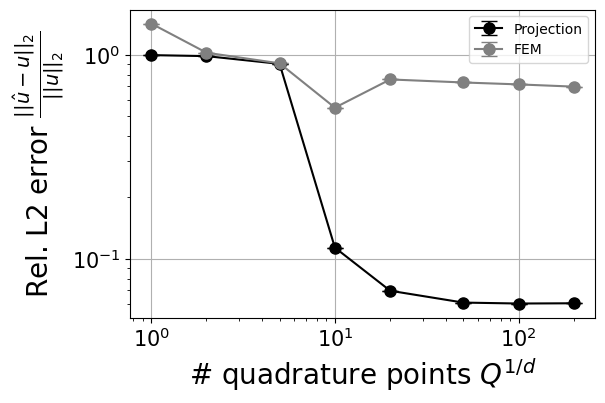

In [15]:
linestyles = ['-','--','--','--','--']
colors = ['C0','C1','C2','C1','C2','C2','C4','C5','C6']

dataset = ManufacturedSolutionsSetDarcy(N_samples=N_samples, variables=['x','x'], l_min=l_min, l_max=l_max, device=device)
theta = dataset.theta
f = dataset.f
etat = dataset.etat
etab = dataset.etab
gl = dataset.gl
gr = dataset.gr
u = dataset.u

size_title = 20
size_ticklabels = 15
size_axeslabels = 20

fig, ax = plt.subplots(1,1, figsize=(6, 4))
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.4)

L2_scaled_avg = np.zeros((len(values)))
yerr = np.zeros((2,len(values)))
for i in range(len(values)):
    model.hparams['modeltype'] = 'projection'
    model.hparams['n_elements'] = 1
    model.hparams['Q'] = values[i]
    model.hparams['dtype'] = torch.float64
    model.hparams['precision'] = 64
    model.hparams['assembly_mode'] = 'series'
    model.hparams['quadrature'] = 'uniform'
    u_exact = discretize_functions(u, x, dtype=model.hparams['dtype'], device=device).cpu().numpy()
    u_hat = model.simforward(theta, f, etab, etat, gl, gr, x, u).detach().cpu().numpy()
    L22_diff = np.sum(w[None,:]*(u_hat - u_exact)**2, axis=-1)
    L2_diff = L22_diff**(1/2)
    L22_norm = np.sum(w[None,:]*(u_exact)**2, axis=-1)
    L2_norm = L22_norm**(1/2)
    L2_scaled_array = L2_diff/np.maximum(L2_norm, 1e-7*np.ones_like(L2_norm))
    L2_scaled_avg[i] = np.average(L2_scaled_array)
    q_l = np.quantile(L2_scaled_array, q_low)
    q_h = np.quantile(L2_scaled_array, q_high)
    yerr[:,i] = np.array([L2_scaled_avg[i] - q_l, -L2_scaled_avg[i] + q_h])

    # plots.append(ax.plot(values, L2_scaled_avg[m], color=colors[m], marker='o', label=labels[m], linestyle='--'))
ax.errorbar(values, L2_scaled_avg, yerr=yerr,  capsize=6, ms=8, label='Projection', color='black', linestyle='-', marker='o')

L2_scaled_avg = np.zeros((len(values)))
yerr = np.zeros((2,len(values)))
for i in range(len(values)):
    model.hparams['modeltype'] = 'FEM'
    model.hparams['n_elements'] = 1
    model.hparams['Neumannseries'] = False
    model.hparams['Q'] = values[i]
    model.hparams['dtype'] = torch.float64
    model.hparams['precision'] = 64
    model.hparams['assembly_mode'] = 'series'
    model.hparams['quadrature'] = 'uniform'
    u_exact = discretize_functions(u, x, dtype=model.hparams['dtype'], device=device).cpu().numpy()
    u_hat = model.simforward(theta, f, etab, etat, gl, gr, x, u).detach().cpu().numpy()
    L22_diff = np.sum(w[None,:]*(u_hat - u_exact)**2, axis=-1)
    L2_diff = L22_diff**(1/2)
    L22_norm = np.sum(w[None,:]*(u_exact)**2, axis=-1)
    L2_norm = L22_norm**(1/2)
    L2_scaled_array = L2_diff/np.maximum(L2_norm, 1e-7*np.ones_like(L2_norm))
    L2_scaled_avg[i] = np.average(L2_scaled_array)
    q_l = np.quantile(L2_scaled_array, q_low)
    q_h = np.quantile(L2_scaled_array, q_high)
    yerr[:,i] = np.array([L2_scaled_avg[i] - q_l, -L2_scaled_avg[i] + q_h])

ax.errorbar(values, L2_scaled_avg, yerr=yerr,  capsize=6, ms=8, label='FEM', color='grey', linestyle='-', marker='o')

ax.tick_params(axis='both', labelsize=size_ticklabels)
# ax.set_title(r'$0.5<\lambda<1$', fontsize=size_title)
ax.set_xlabel(r'# quadrature points $Q^{1/d}$', fontsize=size_axeslabels)
ax.set_ylabel(r'Rel. L2 error $\frac{||\hat{u}-u||_2}{||u||_2}$', fontsize=size_axeslabels)
ax.set_xscale('log')
ax.set_yscale('log')
# ax.set_ylim(1e-6,1e1)
ax.grid()
plt.legend(fontsize=10)
plt.savefig("Fourier_quadrature12.svg", bbox_inches='tight')#, transparent=True)
plt.show()

In [71]:
from NeuralOperator import NeuralOperator

logdir = '../../../nnlogs'
device = 'cuda:3'

models = ['Q/dataNGO','Q/datafreeNGO','Q/modelNGO']
labels = ['Data NGO', 'Data-free NGO', 'Model NGO']
values = [3,6,9,15,30,60,90,150]

N_samples = 1000
l_min = [0.5,0.5]
l_max = [1,1]

alpha = 0.05
q_low = alpha/2
q_high = 1 - q_low

quadrature = UniformQuadrature2D(Q=100)
x = torch.tensor(quadrature.xi_Omega, device=device)
w = quadrature.w_Omega


In [ ]:
from NeuralOperator import NeuralOperator

logdir = '../../../nnlogs'
device = 'cuda:3'

sublogdir = 'POD_denseQ'
POD = loadmodelfromlabel(model=NeuralOperator, label=' Q250', logdir=logdir, sublogdir=sublogdir, device=device)
FEM = loadmodelfromlabel(model=NeuralOperator, label=' Q250', logdir=logdir, sublogdir=sublogdir, device=device)
FEM.hparams['modeltype'] = 'FEM'
FEM.hparams['dtype'] = torch.float64
FEM.hparams['precision'] = 64
FEM.hparams['Neumannseries'] = False
projection = loadmodelfromlabel(model=NeuralOperator, label=' Q250', logdir=logdir, sublogdir=sublogdir, device=device)
projection.hparams['modeltype'] = 'projection'
projection.hparams['dtype'] = torch.float64
projection.hparams['precision'] = 64

models = ['Q/dataNGO','Q/datafreeNGO','Q/modelNGO']
labels = ['Data NGO', 'Data-free NGO', 'Model NGO']
values = [3,6,9,15,30,60,90,150]

N_samples = 1000
l_min = [0.5,0.5]
l_max = [1,1]

alpha = 0.05
q_low = alpha/2
q_high = 1 - q_low

quadrature = UniformQuadrature2D(Q=100)
x = torch.tensor(quadrature.xi_Omega, device=device)
w = quadrature.w_Omega

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Q_L/dataNGO
0
0
0
0
0
0
0


/data/storage8/prins/prins/phd/gitlab/ngo-pde-gk/analysisnotebooks/../testproblems/darcy/NeuralOperator.py:257: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  theta_bar = torch.tensor(torch.sum(self.w_Omega[None,:]*theta, axis=-1), dtype=self.hparams['dtype'], device=self.used_device)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Q_L/datafreeNGO
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Q_L/modelNGO
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


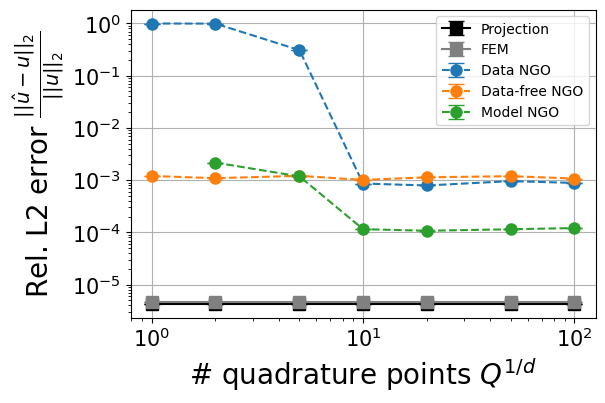

In [ ]:
linestyles = ['-','--','--','--','--']
colors = ['C0','C1','C2','C1','C2','C2','C4','C5','C6']

dataset = ManufacturedSolutionsSetDarcy(N_samples=N_samples, variables=['x','x'], l_min=l_min, l_max=l_max, device=device)
theta = dataset.theta
f = dataset.f
etat = dataset.etat
etab = dataset.etab
gl = dataset.gl
gr = dataset.gr
u = dataset.u
u_exact = discretize_functions(u, x, device=device).cpu().numpy()


size_title = 20
size_ticklabels = 15
size_axeslabels = 20

fig, ax = plt.subplots(1,1, figsize=(6, 4))
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.4)

L2_scaled_avg = np.zeros((len(values)))
yerr = np.zeros((2,len(values)))
for i in range(len(values)):
    model = loadmodelfromlabel(model=NeuralOperator, label=str(values[i]), logdir=logdir, sublogdir='Q_L/modelNGO', device=device)
    model.hparams['modeltype'] = 'projection'
    model.hparams['dtype'] = torch.float64
    u_hat = model.simforward(theta, f, etab, etat, gl, gr, x, u).detach().cpu().numpy()
    L22_diff = np.sum(w[None,:]*(u_hat - u_exact)**2, axis=-1)
    L2_diff = L22_diff**(1/2)
    L22_norm = np.sum(w[None,:]*(u_exact)**2, axis=-1)
    L2_norm = L22_norm**(1/2)
    L2_scaled_array = L2_diff/np.maximum(L2_norm, 1e-7*np.ones_like(L2_norm))
    L2_scaled_avg[i] = np.average(L2_scaled_array)
    q_l = np.quantile(L2_scaled_array, q_low)
    q_h = np.quantile(L2_scaled_array, q_high)
    yerr[:,i] = np.array([L2_scaled_avg[i] - q_l, -L2_scaled_avg[i] + q_h])

# plots.append(ax.plot(values, L2_scaled_avg[m], color=colors[m], marker='^', label='Projection '+labels[m], linestyle='-'))
ax.errorbar(values, L2_scaled_avg, yerr=yerr, capsize=6, ms=8, label='Projection', color='black', linestyle='-', marker='s')

L2_scaled_avg = np.zeros(len(values))
yerr = np.zeros((2,len(values)))
for i in range(len(values)):
    model = loadmodelfromlabel(model=NeuralOperator, label=str(values[i]), logdir=logdir, sublogdir='Q_L/modelNGO', device=device)
    model.hparams['modeltype'] = 'FEM'
    model.hparams['dtype'] = torch.float64
    model.hparams['Neumannseries'] = False 
    u_hat = model.simforward(theta, f, etab, etat, gl, gr, x, u).detach().cpu().numpy()
    L22_diff = np.sum(w[None,:]*(u_hat - u_exact)**2, axis=-1)
    L2_diff = L22_diff**(1/2)
    L22_norm = np.sum(w[None,:]*(u_exact)**2, axis=-1)
    L2_norm = L22_norm**(1/2)
    L2_scaled_array = L2_diff/np.maximum(L2_norm, 1e-7*np.ones_like(L2_norm))
    L2_scaled_avg[i] = np.average(L2_scaled_array)
    q_l = np.quantile(L2_scaled_array, q_low)
    q_h = np.quantile(L2_scaled_array, q_high)
    yerr[:,i] = np.array([L2_scaled_avg[i] - q_l, -L2_scaled_avg[i] + q_h])

# plots.append(ax.plot(values, L2_scaled_avg[m], color=colors[m], marker='^', label='Projection '+labels[m], linestyle='-'))
ax.errorbar(values, L2_scaled_avg, yerr=yerr, capsize=6, ms=8, label='FEM', color='grey', linestyle='-', marker='s')

L2_scaled_avg = np.zeros((len(models),len(values)))
yerr = np.zeros((len(models),2,len(values)))
for m in range(len(models)):
    print(models[m])
    for i in range(len(values)):
        model = loadmodelfromlabel(model=NeuralOperator, label=str(values[i]), logdir=logdir, sublogdir=models[m], device=device)
        u_hat = model.simforward(theta, f, etab, etat, gl, gr, x, u).detach().cpu().numpy()
        L22_diff = np.sum(w[None,:]*(u_hat - u_exact)**2, axis=-1)
        L2_diff = L22_diff**(1/2)
        L22_norm = np.sum(w[None,:]*(u_exact)**2, axis=-1)
        L2_norm = L22_norm**(1/2)
        L2_scaled_array = L2_diff/np.maximum(L2_norm, 1e-7*np.ones_like(L2_norm))
        L2_scaled_avg[m,i] = np.average(L2_scaled_array)
        q_l = np.quantile(L2_scaled_array, q_low)
        q_h = np.quantile(L2_scaled_array, q_high)
        yerr[m,:,i] = np.array([L2_scaled_avg[m,i] - q_l, -L2_scaled_avg[m,i] + q_h])

for m in range(len(models)):
    # plots.append(ax.plot(values, L2_scaled_avg[m], color=colors[m], marker='o', label=labels[m], linestyle='--'))
    ax.errorbar(values, L2_scaled_avg[m], yerr=yerr[m],  capsize=6, ms=8, label=labels[m], color=colors[m], linestyle='--', marker='o')

ax.tick_params(axis='both', labelsize=size_ticklabels)
# ax.set_title(r'$0.5<\lambda<1$', fontsize=size_title)
ax.set_xlabel(r'# quadrature points $Q^{1/d}$', fontsize=size_axeslabels)
ax.set_ylabel(r'Rel. L2 error $\frac{||\hat{u}-u||_2}{||u||_2}$', fontsize=size_axeslabels)
ax.set_xscale('log')
ax.set_yscale('log')
# ax.set_ylim(1e-6,1e1)
ax.grid()
plt.legend(fontsize=10)
plt.savefig("Q.svg", bbox_inches='tight')#, transparent=True)
plt.show()

In [9]:
from NeuralOperator import NeuralOperator

logdir = '../../../nnlogs'
device = 'cuda:3'

models = ['Q_L/dataNGO','Q_L/datafreeNGO','Q_L/modelNGO']
labels = ['Data NGO', 'Data-free NGO', 'Model NGO']
values = [1,2,5,10,20,50,100]

N_samples = 1000
l_min = [0.5,0.5]
l_max = [1,1]

alpha = 0.05
q_low = alpha/2
q_high = 1 - q_low

quadrature = UniformQuadrature2D(Q=100)
x = torch.tensor(quadrature.xi_Omega, device=device)
w = quadrature.w_Omega


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

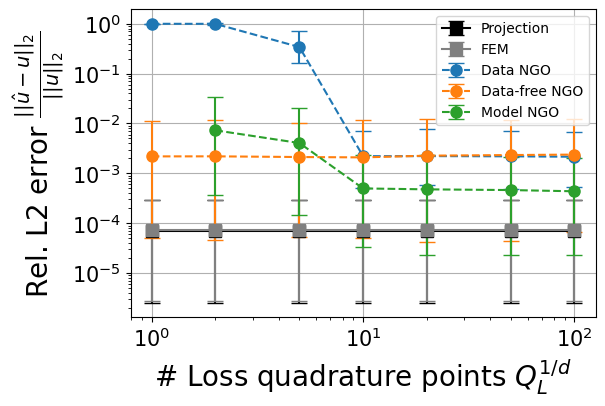

In [ ]:
linestyles = ['-','--','--','--','--']
colors = ['C0','C1','C2','C1','C2','C2','C4','C5','C6']

dataset = ManufacturedSolutionsSetDarcy(N_samples=N_samples, variables=['x','x'], l_min=l_min, l_max=l_max, device=device)
theta = dataset.theta
f = dataset.f
etat = dataset.etat
etab = dataset.etab
gl = dataset.gl
gr = dataset.gr
u = dataset.u
u_exact = discretize_functions(u, x, device=device).cpu().numpy()


size_title = 20
size_ticklabels = 15
size_axeslabels = 20

fig, ax = plt.subplots(1,1, figsize=(6, 4))
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.4)

L2_scaled_avg = np.zeros((len(values)))
yerr = np.zeros((2,len(values)))
for i in range(len(values)):
    model = loadmodelfromlabel(model=NeuralOperator, label=str(values[i]), logdir=logdir, sublogdir='Q_L/modelNGO', device=device)
    model.hparams['modeltype'] = 'projection'
    model.hparams['dtype'] = torch.float64
    u_hat = model.simforward(theta, f, etab, etat, gl, gr, x, u).detach().cpu().numpy()
    L22_diff = np.sum(w[None,:]*(u_hat - u_exact)**2, axis=-1)
    L2_diff = L22_diff**(1/2)
    L22_norm = np.sum(w[None,:]*(u_exact)**2, axis=-1)
    L2_norm = L22_norm**(1/2)
    L2_scaled_array = L2_diff/np.maximum(L2_norm, 1e-7*np.ones_like(L2_norm))
    L2_scaled_avg[i] = np.average(L2_scaled_array)
    q_l = np.quantile(L2_scaled_array, q_low)
    q_h = np.quantile(L2_scaled_array, q_high)
    yerr[:,i] = np.array([L2_scaled_avg[i] - q_l, -L2_scaled_avg[i] + q_h])

# plots.append(ax.plot(values, L2_scaled_avg[m], color=colors[m], marker='^', label='Projection '+labels[m], linestyle='-'))
ax.errorbar(values, L2_scaled_avg, yerr=yerr, capsize=6, ms=8, label='Projection', color='black', linestyle='-', marker='s')

L2_scaled_avg = np.zeros(len(values))
yerr = np.zeros((2,len(values)))
for i in range(len(values)):
    model = loadmodelfromlabel(model=NeuralOperator, label=str(values[i]), logdir=logdir, sublogdir='Q_L/modelNGO', device=device)
    model.hparams['modeltype'] = 'FEM'
    model.hparams['dtype'] = torch.float64
    model.hparams['Neumannseries'] = False 
    u_hat = model.simforward(theta, f, etab, etat, gl, gr, x, u).detach().cpu().numpy()
    L22_diff = np.sum(w[None,:]*(u_hat - u_exact)**2, axis=-1)
    L2_diff = L22_diff**(1/2)
    L22_norm = np.sum(w[None,:]*(u_exact)**2, axis=-1)
    L2_norm = L22_norm**(1/2)
    L2_scaled_array = L2_diff/np.maximum(L2_norm, 1e-7*np.ones_like(L2_norm))
    L2_scaled_avg[i] = np.average(L2_scaled_array)
    q_l = np.quantile(L2_scaled_array, q_low)
    q_h = np.quantile(L2_scaled_array, q_high)
    yerr[:,i] = np.array([L2_scaled_avg[i] - q_l, -L2_scaled_avg[i] + q_h])

# plots.append(ax.plot(values, L2_scaled_avg[m], color=colors[m], marker='^', label='Projection '+labels[m], linestyle='-'))
ax.errorbar(values, L2_scaled_avg, yerr=yerr, capsize=6, ms=8, label='FEM', color='grey', linestyle='-', marker='s')

L2_scaled_avg = np.zeros((len(models),len(values)))
yerr = np.zeros((len(models),2,len(values)))
for m in range(len(models)):
    print(models[m])
    for i in range(len(values)):
        model = loadmodelfromlabel(model=NeuralOperator, label=str(values[i]), logdir=logdir, sublogdir=models[m], device=device)
        u_hat = model.simforward(theta, f, etab, etat, gl, gr, x, u).detach().cpu().numpy()
        L22_diff = np.sum(w[None,:]*(u_hat - u_exact)**2, axis=-1)
        L2_diff = L22_diff**(1/2)
        L22_norm = np.sum(w[None,:]*(u_exact)**2, axis=-1)
        L2_norm = L22_norm**(1/2)
        L2_scaled_array = L2_diff/np.maximum(L2_norm, 1e-7*np.ones_like(L2_norm))
        L2_scaled_avg[m,i] = np.average(L2_scaled_array)
        q_l = np.quantile(L2_scaled_array, q_low)
        q_h = np.quantile(L2_scaled_array, q_high)
        yerr[m,:,i] = np.array([L2_scaled_avg[m,i] - q_l, -L2_scaled_avg[m,i] + q_h])

for m in range(len(models)):
    # plots.append(ax.plot(values, L2_scaled_avg[m], color=colors[m], marker='o', label=labels[m], linestyle='--'))
    ax.errorbar(values, L2_scaled_avg[m], yerr=yerr[m],  capsize=6, ms=8, label=labels[m], color=colors[m], linestyle='--', marker='o')

ax.tick_params(axis='both', labelsize=size_ticklabels)
# ax.set_title(r'$0.5<\lambda<1$', fontsize=size_title)
ax.set_xlabel(r'# Loss quadrature points $Q_L^{1/d}$', fontsize=size_axeslabels)
ax.set_ylabel(r'Rel. L2 error $\frac{||\hat{u}-u||_2}{||u||_2}$', fontsize=size_axeslabels)
ax.set_xscale('log')
ax.set_yscale('log')
# ax.set_ylim(1e-6,1e1)
ax.grid()
plt.legend(fontsize=10)
plt.savefig("Q_L.svg", bbox_inches='tight')#, transparent=True)
plt.show()

In [14]:
from NeuralOperator import NeuralOperator

logdir = '../../../nnlogs'
device = 'cuda:1'

models = ['N_w_models/dataNGO','N_w_models/datafreeNGO','N_w_models/modelNGO']
labels = ['Data NGO','Data-free NGO','Model NGO']
values = [2000, 5000, 10000, 20000, 30000, 50000, 100000, 200000, 500000, 1000000]

N_samples = 1000
l_min = 0.5
l_max = 1

alpha = 0.05
q_low = alpha/2
q_high = 1 - q_low

quadrature = UniformQuadrature2D(Q=100)
x = torch.tensor(quadrature.xi_Omega, device=device)
w = quadrature.w_Omega

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

/tmp/ipykernel_2115238/3962842514.py:39: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string ".-" (-> linestyle='-'). The keyword argument will take precedence.
  plots.append(ax.errorbar(values, L2_scaled_avg, yerr=yerr, fmt=".-", capsize=6, ms=15, label='Projection', color='black', linestyle='-'))


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

/tmp/ipykernel_2115238/3962842514.py:61: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string ".-" (-> linestyle='-'). The keyword argument will take precedence.
  plots.append(ax.errorbar(N_w_real[m], L2_scaled_avg[m], yerr=yerr[m], fmt=".-", capsize=6, ms=15, label=labels[m], color=colors[m], linestyle='--'))


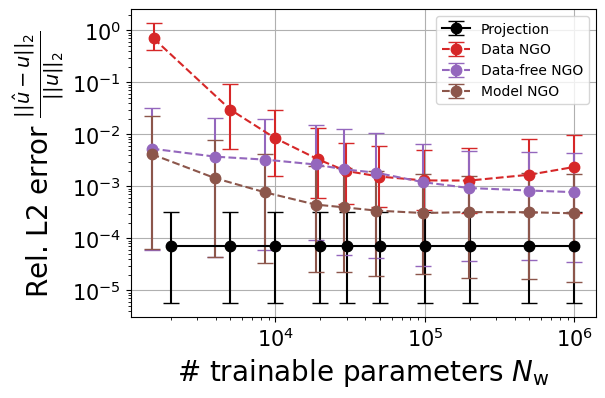

: 

In [ ]:
linestyles = ['--','--','--','--','--']
colors = ['C3','C4','C5','C6']

size_title = 20
size_ticklabels = 15
size_axeslabels = 20

dataset = ManufacturedSolutionsSetDarcy(N_samples=N_samples, d=2, l_min=l_min, l_max=l_max, device=device)
theta = dataset.theta
f = dataset.f
etat = dataset.etat
etab = dataset.etab
gl = dataset.gl
gr = dataset.gr
u = dataset.u
u_exact = discretize_functions(u, x, device=device).cpu().numpy()

L2_scaled_avg = np.zeros((len(values)))
yerr = np.zeros((2,len(values)))
for i in range(len(values)):
    model = loadmodelfromlabel(model=NeuralOperator, label='2000', logdir=logdir, sublogdir='N_w_models/modelNGO', device=device)
    model.hparams['modeltype'] = 'projection'
    u_hat = model.simforward(theta, f, etab, etat, gl, gr, x, u).cpu().numpy()
    L22_diff = np.sum(w[None,:]*(u_hat - u_exact)**2, axis=-1)
    L2_diff = L22_diff**(1/2)
    L22_norm = np.sum(w[None,:]*(u_exact)**2, axis=-1)
    L2_norm = L22_norm**(1/2)
    L2_scaled_array = L2_diff/np.maximum(L2_norm, 1e-7*np.ones_like(L2_norm))
    L2_scaled_avg[i] = np.average(L2_scaled_array)
    q_l = np.quantile(L2_scaled_array, q_low)
    q_h = np.quantile(L2_scaled_array, q_high)
    yerr[:,i] = np.array([L2_scaled_avg[i] - q_l, -L2_scaled_avg[i] + q_h])

fig, ax = plt.subplots(1,1, figsize=(6, 4))
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.4)

plots = []
    # plots.append(ax.plot(l, L2_scaled_avg[m], color=colors[m], label=str(model), linestyle=linestyles[m]))
plots.append(ax.errorbar(values, L2_scaled_avg, yerr=yerr, fmt=".-", capsize=6, ms=15, label='Projection', color='black', linestyle='-'))

L2_scaled_avg = np.zeros((len(models),len(values)))
yerr = np.zeros((len(models),2,len(values)))
N_w_real = np.zeros((len(models),len(values)))
for m in range(len(models)):
    for i in range(len(values)):
        model = loadmodelfromlabel(model=NeuralOperator, label=str(values[i]), logdir=logdir, sublogdir=models[m], device=device)
        N_w_real[m,i] = model.hparams['N_w_real']
        u_hat = model.simforward(theta, f, etab, etat, gl, gr, x, u).cpu().detach().numpy()
        L22_diff = np.sum(w[None,:]*(u_hat - u_exact)**2, axis=-1)
        L2_diff = L22_diff**(1/2)
        L22_norm = np.sum(w[None,:]*(u_exact)**2, axis=-1)
        L2_norm = L22_norm**(1/2)
        L2_scaled_array = L2_diff/np.maximum(L2_norm, 1e-7*np.ones_like(L2_norm))
        L2_scaled_avg[m,i] = np.average(L2_scaled_array)
        q_l = np.quantile(L2_scaled_array, q_low)
        q_h = np.quantile(L2_scaled_array, q_high)
        yerr[m,:,i] = np.array([L2_scaled_avg[m,i] - q_l, -L2_scaled_avg[m,i] + q_h])

for m in range(len(models)):
    # plots.append(ax.plot(l, L2_scaled_avg[m], color=colors[m], label=str(model), linestyle=linestyles[m]))
    plots.append(ax.errorbar(N_w_real[m], L2_scaled_avg[m], yerr=yerr[m], fmt=".-", capsize=6, ms=15, label=labels[m], color=colors[m], linestyle='--'))

ax.tick_params(axis='both', labelsize=size_ticklabels)
# ax.set_title(r'$\lambda=0.1$', fontsize=size_title)
ax.set_xlabel(r'# trainable parameters $N_{\mathrm{w}}$', fontsize=size_axeslabels)
ax.set_ylabel(r'Rel. L2 error $\frac{||\hat{u}-u||_2}{||u||_2}$', fontsize=size_axeslabels)
ax.set_xscale('log')
ax.set_yscale('log')
ax.grid()
plt.legend(handles=plots, fontsize=10)
plt.savefig("N_w.svg", bbox_inches='tight')#, transparent=True)

In [23]:
from NeuralOperator import NeuralOperator

logdir = '../../../nnlogs'
device = 'cuda:3'

models = ['N_samples/dataNGO','N_samples/datafreeNGO','N_samples/modelNGO_uloss','N_samples/modelNGO_uAloss']
labels = ['Data NGO','Data-free NGO','Model NGO (u)','Model NGO (u&A)']
values = [100,1000,10000,100000]

N_samples = 1000
l_min = [0.5,0.5]
l_max = [1,1]

alpha = 0.05
q_low = alpha/2
q_high = 1 - q_low

quadrature = UniformQuadrature2D(Q=100)
x = torch.tensor(quadrature.xi_Omega, device=device)
w = quadrature.w_Omega

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

/tmp/ipykernel_2261634/873562248.py:39: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string ".-" (-> linestyle='-'). The keyword argument will take precedence.
  plots.append(ax.errorbar(values, L2_scaled_avg, yerr=yerr, fmt=".-", capsize=6, ms=15, label='Projection', color='black', linestyle='-'))


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

/tmp/ipykernel_2261634/873562248.py:61: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string ".-" (-> linestyle='-'). The keyword argument will take precedence.
  plots.append(ax.errorbar(values, L2_scaled_avg[m], yerr=yerr[m], fmt=".-", capsize=6, ms=15, label=labels[m], color=colors[m], linestyle='--'))


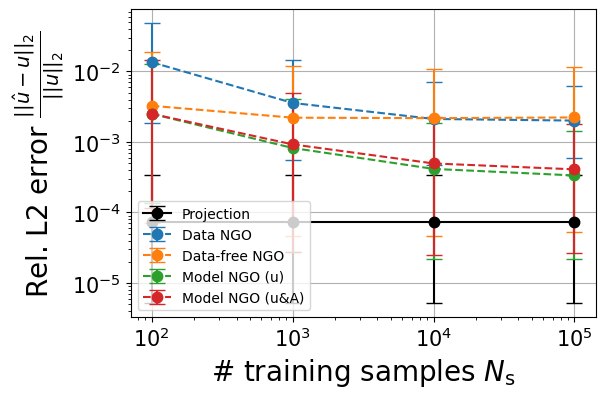

In [ ]:
linestyles = ['--','--','--','--','--']
colors = ['C0','C1','C2','C3']

size_title = 20
size_ticklabels = 15
size_axeslabels = 20

dataset = ManufacturedSolutionsSetDarcy(N_samples=N_samples, variables=['x','x'], l_min=l_min, l_max=l_max, device=device)
theta = dataset.theta
f = dataset.f
etat = dataset.etat
etab = dataset.etab
gl = dataset.gl
gr = dataset.gr
u = dataset.u
u_exact = discretize_functions(u, x, device=device).cpu().numpy()

L2_scaled_avg = np.zeros((len(values)))
yerr = np.zeros((2,len(values)))
for i in range(len(values)):
    model = loadmodelfromlabel(model=NeuralOperator, label='100', logdir=logdir, sublogdir='N_samples/modelNGO_uloss', device=device)
    model.hparams['modeltype'] = 'projection'
    u_hat = model.simforward(theta, f, etab, etat, gl, gr, x, u).cpu().numpy()
    L22_diff = np.sum(w[None,:]*(u_hat - u_exact)**2, axis=-1)
    L2_diff = L22_diff**(1/2)
    L22_norm = np.sum(w[None,:]*(u_exact)**2, axis=-1)
    L2_norm = L22_norm**(1/2)
    L2_scaled_array = L2_diff/np.maximum(L2_norm, 1e-7*np.ones_like(L2_norm))
    L2_scaled_avg[i] = np.average(L2_scaled_array)
    q_l = np.quantile(L2_scaled_array, q_low)
    q_h = np.quantile(L2_scaled_array, q_high)
    yerr[:,i] = np.array([L2_scaled_avg[i] - q_l, -L2_scaled_avg[i] + q_h])

fig, ax = plt.subplots(1,1, figsize=(6, 4))
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.4)

plots = []
    # plots.append(ax.plot(l, L2_scaled_avg[m], color=colors[m], label=str(model), linestyle=linestyles[m]))
plots.append(ax.errorbar(values, L2_scaled_avg, yerr=yerr, fmt=".-", capsize=6, ms=15, label='Projection', color='black', linestyle='-'))

L2_scaled_avg = np.zeros((len(models),len(values)))
yerr = np.zeros((len(models),2,len(values)))
N_w_real = np.zeros((len(models),len(values)))
for m in range(len(models)):
    for i in range(len(values)):
        model = loadmodelfromlabel(model=NeuralOperator, label=str(values[i]), logdir=logdir, sublogdir=models[m], device=device)
        N_w_real[m,i] = model.hparams['N_w_real']
        u_hat = model.simforward(theta, f, etab, etat, gl, gr, x, u).cpu().detach().numpy()
        L22_diff = np.sum(w[None,:]*(u_hat - u_exact)**2, axis=-1)
        L2_diff = L22_diff**(1/2)
        L22_norm = np.sum(w[None,:]*(u_exact)**2, axis=-1)
        L2_norm = L22_norm**(1/2)
        L2_scaled_array = L2_diff/np.maximum(L2_norm, 1e-7*np.ones_like(L2_norm))
        L2_scaled_avg[m,i] = np.average(L2_scaled_array)
        q_l = np.quantile(L2_scaled_array, q_low)
        q_h = np.quantile(L2_scaled_array, q_high)
        yerr[m,:,i] = np.array([L2_scaled_avg[m,i] - q_l, -L2_scaled_avg[m,i] + q_h])

for m in range(len(models)):
    # plots.append(ax.plot(l, L2_scaled_avg[m], color=colors[m], label=str(model), linestyle=linestyles[m]))
    plots.append(ax.errorbar(values, L2_scaled_avg[m], yerr=yerr[m], fmt=".-", capsize=6, ms=15, label=labels[m], color=colors[m], linestyle='--'))

ax.tick_params(axis='both', labelsize=size_ticklabels)
# ax.set_title(r'$\lambda=0.1$', fontsize=size_title)
ax.set_xlabel(r'# training samples $N_{\mathrm{s}}$', fontsize=size_axeslabels)
ax.set_ylabel(r'Rel. L2 error $\frac{||\hat{u}-u||_2}{||u||_2}$', fontsize=size_axeslabels)
ax.set_xscale('log')
ax.set_yscale('log')
ax.grid()
plt.legend(handles=plots, fontsize=10)
plt.savefig("N_s.svg", bbox_inches='tight')#, transparent=True)

In [8]:
from NeuralOperator import NeuralOperator

logdir = '../../../nnlogs/N_epochs'
device = 'cuda:2'

models = ['U-Net','DeepONet','VarMiON','dataNGO','datafreeNGO','modelNGO','FNO']
labels = ['U-Net','DeepONet','VarMiON','Data NGO','Data-free NGO', 'Model NGO','FNO']
values = [1,2,5,10,20,50,100,200,500,1000,2000,5000,10000,20000,50000]

N_samples = 100
l_min = 0.5
l_max = 1

alpha = 0.05
q_low = alpha/2
q_high = 1 - q_low

quadrature = UniformQuadrature2D(Q=100)
x = torch.tensor(quadrature.xi_Omega, device=device)
w = quadrature.w_Omega

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46

/tmp/ipykernel_2254903/3317369771.py:40: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string ".-" (-> linestyle='-'). The keyword argument will take precedence.
  plots.append(ax.errorbar(np.array(values), L2_scaled_avg, yerr=yerr, fmt=".-", capsize=6, ms=15, label='Projection', color='black', linestyle='-'))


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46

/tmp/ipykernel_2254903/3317369771.py:60: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string ".-" (-> linestyle='-'). The keyword argument will take precedence.
  plots.append(ax.errorbar(np.array(values), L2_scaled_avg[m], yerr=yerr[m], fmt=".-", capsize=6, ms=15, label=labels[m], color=colors[m], linestyle=linestyles[m]))


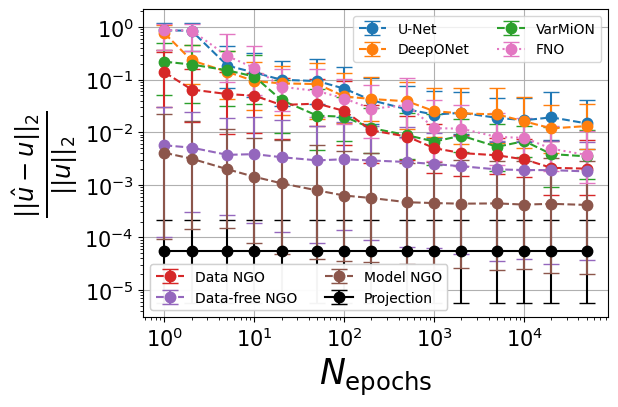

In [ ]:
linestyles = ['--','--','--','--','--','--','dotted','--','--']
colors = ['C0','C1','C2','C3','C4','C5','C6','C7','C8']

size_title = 20
size_ticklabels = 15
size_axeslabels = 25

dataset = ManufacturedSolutionsSetDarcy(N_samples=N_samples, d=2, l_min=l_min, l_max=l_max, device=device)
theta = dataset.theta
f = dataset.f
etat = dataset.etat
etab = dataset.etab
gl = dataset.gl
gr = dataset.gr
u = dataset.u
u_exact = discretize_functions(u, x, device=device).cpu().detach().numpy()

L2_scaled_avg = np.zeros((len(values)))
yerr = np.zeros((2,len(values)))
for i in range(len(values)):
    model = loadmodelfromlabel(model=NeuralOperator, label='2000', logdir='../../../nnlogs/N_epochs', sublogdir='modelNGO', device=device)
    model.hparams['modeltype'] = 'projection'
    u_hat = model.simforward(theta, f, etab, etat, gl, gr, x, u).cpu().detach().numpy()
    L22_diff = np.sum(w[None,:]*(u_hat - u_exact)**2, axis=-1)
    L2_diff = L22_diff**(1/2)
    L22_norm = np.sum(w[None,:]*(u_exact)**2, axis=-1)
    L2_norm = L22_norm**(1/2)
    L2_scaled_array = L2_diff/np.maximum(L2_norm, 1e-7*np.ones_like(L2_norm))
    L2_scaled_avg[i] = np.average(L2_scaled_array)
    q_l = np.quantile(L2_scaled_array, q_low)
    q_h = np.quantile(L2_scaled_array, q_high)
    yerr[:,i] = np.array([L2_scaled_avg[i] - q_l, -L2_scaled_avg[i] + q_h])

fig, ax = plt.subplots(1,1, figsize=(6, 4))
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.4)

plots = []
# for m in range(len(models)):
    # plots.append(ax.plot(l, L2_scaled_avg[m], color=colors[m], label=str(model), linestyle=linestyles[m]))
plots.append(ax.errorbar(np.array(values), L2_scaled_avg, yerr=yerr, fmt=".-", capsize=6, ms=15, label='Projection', color='black', linestyle='-'))

L2_scaled_avg = np.zeros((len(models),len(values)))
yerr = np.zeros((len(models),2,len(values)))
for m in range(len(models)):
    for i in range(len(values)):
        model = loadmodelfromlabel(model=NeuralOperator, label=str(values[i]), logdir=logdir, sublogdir=models[m], device=device)
        u_hat = model.simforward(theta, f, etab, etat, gl, gr, x, u).cpu().detach().numpy()
        L22_diff = np.sum(w[None,:]*(u_hat - u_exact)**2, axis=-1)
        L2_diff = L22_diff**(1/2)
        L22_norm = np.sum(w[None,:]*(u_exact)**2, axis=-1)
        L2_norm = L22_norm**(1/2)
        L2_scaled_array = L2_diff/np.maximum(L2_norm, 1e-7*np.ones_like(L2_norm))
        L2_scaled_avg[m,i] = np.average(L2_scaled_array)
        q_l = np.quantile(L2_scaled_array, q_low)
        q_h = np.quantile(L2_scaled_array, q_high)
        yerr[m,:,i] = np.array([L2_scaled_avg[m,i] - q_l, -L2_scaled_avg[m,i] + q_h])

for m in range(len(models)):
    # plots.append(ax.plot(l, L2_scaled_avg[m], color=colors[m], label=str(model), linestyle=linestyles[m]))
    plots.append(ax.errorbar(np.array(values), L2_scaled_avg[m], yerr=yerr[m], fmt=".-", capsize=6, ms=15, label=labels[m], color=colors[m], linestyle=linestyles[m]))

ax.tick_params(axis='both', labelsize=size_ticklabels)
# ax.set_title(r'$\lambda=0.1$', fontsize=size_title)
ax.set_xlabel(r'$N_{\mathrm{epochs}}$', fontsize=size_axeslabels)
ax.set_ylabel(r'$\frac{||\hat{u}-u||_2}{||u||_2}$', fontsize=size_axeslabels)
ax.set_xscale('log')
ax.set_yscale('log')
ax.grid()
legend1 = ax.legend(handles=[plots[1],plots[2],plots[3],plots[7]], fontsize=10, ncols=2, loc='upper right')
plt.gca().add_artist(legend1)
legend2 = ax.legend(handles=[plots[4],plots[5],plots[6],plots[0]], fontsize=10, ncols=2, loc='lower left')
plt.gca().add_artist(legend2)
# plt.legend(fontsize=10, ncols=2, loc='upper right')
plt.savefig("N_epochs.svg", bbox_inches='tight')#, transparent=True)